In [1]:
import pandas as pd 

# Read Price Data Excel file
df_price = pd.read_excel('./data_sources/Price Data.xlsx')                        
df_price_cleaned = df_price[['DateValueCET', 'TimeValueCET', 'PowerPriceAreaCode', 'PriceMWh']]

# Read Rain Data Excel file
df_rain = pd.read_excel('./data_sources/Brazil Rain Data.xlsx')
df_rain_cleaned = df_rain[['DateValueCET', 'TimeValueCET', 'PowerPriceAreaCode', 'Value']]


# Read Rain Data Excel file
df_temperature = pd.read_excel('./data_sources/Temperature_Data.xlsx')
df_temperature_cleaned = df_temperature[['DateValueCET', 'TimeValueCET', 'PowerPriceAreaCode', 'Value']]


display(df_temperature.head())


,DataProvider,DataSource,DateForecastCET,DateValueCET,TimeValueCET,TimeValueUTCOffset,PowerPriceArea,PowerPriceAreaCode,PowerGrid,PowerGridCode,...,ForecastDateTimeOffset,ValueDateTimeOffset,Value,Probability,ReportDateTimeOffset,RowInsertedToARIS,RowUpdatedInARIS,ValueDateOffset,ForecastDateOffset,PowerPriceAreaCountry
0,Point Carbon,PointConnect,2024-09-13,2024-09-28,02:00:00,+02:00,Brazil-Northeast,BRAZIL_NORTHEAST,NaN,NaN,...,2024-09-12 21:00:00.000 -03:00,2024-09-27 21:00:00.000 -03:00,24.21,NaN,2024-09-13 08:27:18.261 +02:00,2024-09-13 08:44:22.010 +02:00,2024-09-13 08:44:22.010 +02:00,2024-09-27 21:00:00.000 -03:00,2024-09-12 21:00:00.000 -03:00,Brazil
1,Point Carbon,PointConnect,2024-09-13,2024-09-28,02:00:00,+02:00,Brazil-Southeast/CentralWest,BRAZIL_SOUTHEAST_CENTRALWEST,NaN,NaN,...,2024-09-12 21:00:00.000 -03:00,2024-09-27 21:00:00.000 -03:00,21.32,NaN,2024-09-13 08:27:23.362 +02:00,2024-09-13 08:44:22.010 +02:00,2024-09-13 08:44:22.010 +02:00,2024-09-27 21:00:00.000 -03:00,2024-09-12 21:00:00.000 -03:00,Brazil
2,Point Carbon,PointConnect,2024-09-13,2024-09-28,02:00:00,+02:00,Brazil-North,BRAZIL_NORTH,NaN,NaN,...,2024-09-12 21:00:00.000 -03:00,2024-09-27 21:00:00.000 -03:00,26.93,NaN,2024-09-13 08:27:22.190 +02:00,2024-09-13 08:44:22.010 +02:00,2024-09-13 08:44:22.010 +02:00,2024-09-27 21:00:00.000 -03:00,2024-09-12 21:00:00.000 -03:00,Brazil
3,Point Carbon,PointConnect,2024-09-13,2024-09-28,02:00:00,+02:00,Brazil-South,BRAZIL_SOUTH,NaN,NaN,...,2024-09-12 21:00:00.000 -03:00,2024-09-27 21:00:00.000 -03:00,18.86,NaN,2024-09-13 08:27:24.461 +02:00,2024-09-13 08:44:22.010 +02:00,2024-09-13 08:44:22.010 +02:00,2024-09-27 21:00:00.000 -03:00,2024-09-12 21:00:00.000 -03:00,Brazil
4,Point Carbon,PointConnect,2024-09-13,2024-09-28,01:00:00,+02:00,Brazil-Northeast,BRAZIL_NORTHEAST,NaN,NaN,...,2024-09-12 21:00:00.000 -03:00,2024-09-27 20:00:00.000 -03:00,25.00,NaN,2024-09-13 08:27:18.261 +02:00,2024-09-13 08:44:22.010 +02:00,2024-09-13 08:44:22.010 +02:00,2024-09-27 20:00:00.000 -03:00,2024-09-12 21:00:00.000 -03:00,Brazil


Data:

Dataset: Brazilian Price Data
- hourly price log data
- regional
- the hourly price are in BRL(Brazilian Real) per MW/h

In [2]:
# check for missing values
print(df_price_cleaned.isnull().sum())

DateValueCET          0
TimeValueCET          0
PowerPriceAreaCode    0
PriceMWh              0
dtype: int64


In [3]:
df_price_cleaned['DateTime'] = pd.to_datetime(df_price_cleaned['DateValueCET'].astype(str) + ' ' + df_price_cleaned['TimeValueCET'].astype(str))


C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\126388561.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_price_cleaned['DateTime'] = pd.to_datetime(df_price_cleaned['DateValueCET'].astype(str) + ' ' + df_price_cleaned['TimeValueCET'].astype(str))


In [4]:
import plotly.express as px

# Create a line plot
fig = px.line( 
    df_price_cleaned,
    x='DateTime',
    y='PriceMWh',
    color='PowerPriceAreaCode',
    title='Electricity Prices Over Time by Region',
    labels={'PriceMWh': 'Price (MWh)', 'DateTime': 'Date and Time'}
)

""" # Update layout for better visibility
fig.update_layout(
    xaxis_title='Date and Time',
    yaxis_title='Price (MWh)',
    legend_title='Region',
    xaxis=dict(tickformat="%Y-%m-%d %H:%M")
) """

fig.show()


In [11]:
import plotly.express as px

df_price_cleaned['DateValueCET'] = pd.to_datetime(df_price_cleaned['DateValueCET'])

# Convert 'TimeValueCET' to hour format
df_price_cleaned['Hour'] = pd.to_datetime(df_price_cleaned['TimeValueCET'], format='%H:%M:%S').dt.hour

# Filter for a specific year, e.g., 2022
year_filter = 2022
df_filtered = df_price_cleaned[df_price_cleaned['DateValueCET'].dt.year == year_filter]

# Create a line plot
fig = px.line( 
    df_filtered,
    x='DateTime',
    y='PriceMWh',
    color='PowerPriceAreaCode',
    title='Electricity Prices Over Time by Region',
    labels={'PriceMWh': 'Price (MWh)', 'DateTime': 'Date and Time'}
)

""" # Update layout for better visibility
fig.update_layout(
    xaxis_title='Date and Time',
    yaxis_title='Price (MWh)',
    legend_title='Region',
    xaxis=dict(tickformat="%Y-%m-%d %H:%M")
) """

fig.show()


C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\1414359513.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\1414359513.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\123150270.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



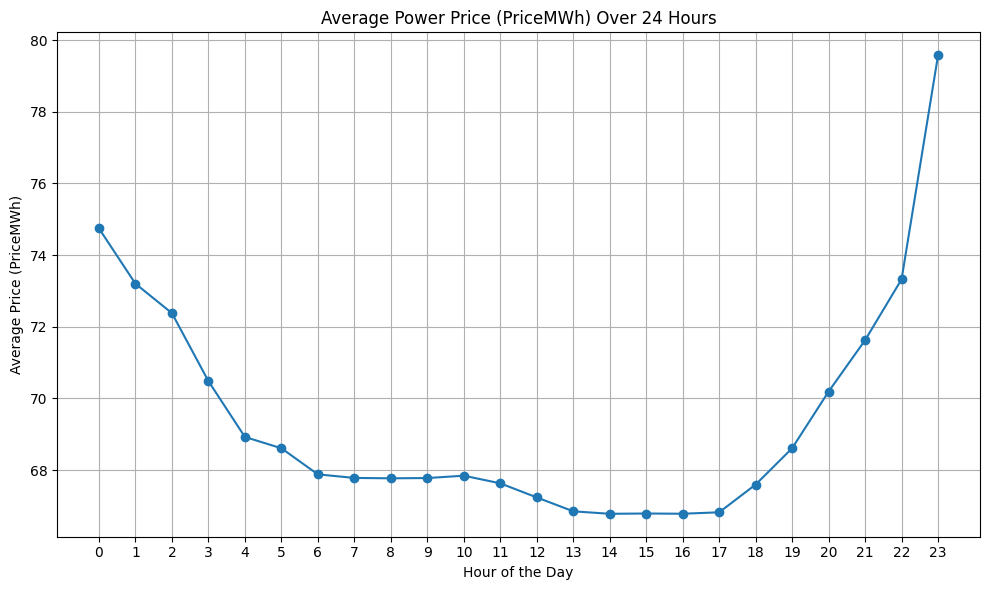

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_price_hours = df_price_cleaned[['DateValueCET', 'TimeValueCET', 'PowerPriceAreaCode', 'PriceMWh']]
df_price_hours['TimeValueCET'] = pd.to_datetime(df_price_hours['TimeValueCET'], format='%H:%M:%S').dt.hour

df_grouped_by_hour = df_price_hours.groupby('TimeValueCET').agg({
    'PriceMWh': 'mean',  # Average price per hour
    'PowerPriceAreaCode': 'first',  # Example, choose one value from PowerPriceAreaCode
    'DateValueCET': 'count'  # Count occurrences
}).reset_index()

#Plot the average PriceMWh over the hours of the day
plt.figure(figsize=(10, 6))
plt.plot(df_grouped_by_hour['TimeValueCET'], df_grouped_by_hour['PriceMWh'], marker='o')

# Set x-axis to display 24 hours
plt.xticks(range(0, 24))  # Set ticks from 0 to 23

# Add labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Average Price (PriceMWh)')
plt.title('Average Power Price (PriceMWh) Over 24 Hours')
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


In [6]:
import pandas as pd
import plotly.express as px

# Assuming df_price_cleaned is already available and 'DateValueCET' and 'TimeValueCET' columns are in proper datetime format
# Convert 'DateValueCET' to datetime if not already
df_price_cleaned['DateValueCET'] = pd.to_datetime(df_price_cleaned['DateValueCET'])

# Convert 'TimeValueCET' to hour format
df_price_cleaned['Hour'] = pd.to_datetime(df_price_cleaned['TimeValueCET'], format='%H:%M:%S').dt.hour

# Filter for a specific year, e.g., 2024
year_filter = 2024
df_filtered = df_price_cleaned[df_price_cleaned['DateValueCET'].dt.year == year_filter]

# Group by region and hour, and calculate the mean price per hour for each region
df_grouped = df_filtered.groupby(['PowerPriceAreaCode', 'Hour']).agg({
    'PriceMWh': 'mean'  # Average price per hour for each region
}).reset_index()

# Create an interactive line plot using Plotly
fig = px.line(df_grouped, x='Hour', y='PriceMWh', color='PowerPriceAreaCode',
              labels={
                  'Hour': 'Hour of the Day',
                  'PriceMWh': 'Average Price (PriceMWh)',
                  'PowerPriceAreaCode': 'Region'
              },
              title=f'Average Power Price (PriceMWh) Over 24 Hours for {year_filter} by Region')

# Customize the layout for better interactivity
fig.update_layout(
    xaxis=dict(tickmode='linear', tick0=0, dtick=1),  # Set x-axis ticks to display all 24 hours
    hovermode='x unified',  # Show hover info for all regions at the same time on the x-axis
    width=900,
    height=600
)

# Show the interactive plot
fig.show()


C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\3620736662.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\3620736662.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [7]:
import pandas as pd
import plotly.express as px

# Assuming df_price_cleaned is already available and 'DateValueCET' and 'TimeValueCET' columns are in proper datetime format
# Convert 'DateValueCET' to datetime if not already
df_price_cleaned['DateValueCET'] = pd.to_datetime(df_price_cleaned['DateValueCET'])

# Convert 'TimeValueCET' to hour format
df_price_cleaned['Hour'] = pd.to_datetime(df_price_cleaned['TimeValueCET'], format='%H:%M:%S').dt.hour

# Filter for a specific year, e.g., 2023
year_filter = 2023
df_filtered = df_price_cleaned[df_price_cleaned['DateValueCET'].dt.year == year_filter]

# Group by region and hour, and calculate the mean price per hour for each region
df_grouped = df_filtered.groupby(['PowerPriceAreaCode', 'Hour']).agg({
    'PriceMWh': 'mean'  # Average price per hour for each region
}).reset_index()

# Create an interactive line plot using Plotly
fig = px.line(df_grouped, x='Hour', y='PriceMWh', color='PowerPriceAreaCode',
              labels={
                  'Hour': 'Hour of the Day',
                  'PriceMWh': 'Average Price (PriceMWh)',
                  'PowerPriceAreaCode': 'Region'
              },
              title=f'Average Power Price (PriceMWh) Over 24 Hours for {year_filter} by Region')

# Customize the layout for better interactivity
fig.update_layout(
    xaxis=dict(tickmode='linear', tick0=0, dtick=1),  # Set x-axis ticks to display all 24 hours
    hovermode='x unified',  # Show hover info for all regions at the same time on the x-axis
    width=900,
    height=600
)

# Show the interactive plot
fig.show()


C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\3746353322.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\3746353322.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [8]:
import pandas as pd
import plotly.express as px

# Assuming df_price_cleaned is already available and 'DateValueCET' and 'TimeValueCET' columns are in proper datetime format
# Convert 'DateValueCET' to datetime if not already
df_price_cleaned['DateValueCET'] = pd.to_datetime(df_price_cleaned['DateValueCET'])

# Convert 'TimeValueCET' to hour format
df_price_cleaned['Hour'] = pd.to_datetime(df_price_cleaned['TimeValueCET'], format='%H:%M:%S').dt.hour

# Filter for a specific year, e.g., 2022
year_filter = 2022
df_filtered = df_price_cleaned[df_price_cleaned['DateValueCET'].dt.year == year_filter]

# Group by region and hour, and calculate the mean price per hour for each region
df_grouped = df_filtered.groupby(['PowerPriceAreaCode', 'Hour']).agg({
    'PriceMWh': 'mean'  # Average price per hour for each region
}).reset_index()

# Create an interactive line plot using Plotly
fig = px.line(df_grouped, x='Hour', y='PriceMWh', color='PowerPriceAreaCode',
              labels={
                  'Hour': 'Hour of the Day',
                  'PriceMWh': 'Average Price (PriceMWh)',
                  'PowerPriceAreaCode': 'Region'
              },
              title=f'Average Power Price (PriceMWh) Over 24 Hours for {year_filter} by Region')

# Customize the layout for better interactivity
fig.update_layout(
    xaxis=dict(tickmode='linear', tick0=0, dtick=1),  # Set x-axis ticks to display all 24 hours
    hovermode='x unified',  # Show hover info for all regions at the same time on the x-axis
    width=900,
    height=600
)

# Show the interactive plot
fig.show()


C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\1630995624.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\1630995624.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### # Rain Data Exploration

In [9]:
df_rain_cleaned['DateTime'] = pd.to_datetime(df_rain_cleaned['DateValueCET'].astype(str) + ' ' + df_rain_cleaned['TimeValueCET'].astype(str))
df_rain_cleaned['Value_MWh'] = df_rain_cleaned['Value'] * 1000  # Convert GWh to MWh




C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\172986080.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lilla\AppData\Local\Temp\ipykernel_37144\172986080.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [10]:
import plotly.express as px

# Create a line plot
fig = px.line( 
    df_rain_cleaned,
    x='DateTime',
    y='Value_MWh',
    color='PowerPriceAreaCode',
    title='Potential of energy generation of hydroplants Over Time by Region',
    labels={'Value_MWh': ' MWh', 'DateTime': 'Date and Time'}
)



fig.show()
